In [319]:
from maap.maap import MAAP
maap = MAAP(maap_host='api.maap-project.org')

# DPS the export of Google Earth Engine assets to MAAP

These assets were created and exported by tile via a loop in Google Earth Engine here:  
https://code.earthengine.google.com/?scriptPath=users%2Fmmacander%2Fveg_structure%3Asentinel_1%2Fseasonal_s1_tile_export_v2  
old version:  
https://code.earthengine.google.com/?scriptPath=users%2Fpaulmontesano%2Fdefault%3Aseasonal_s1_tile_export

and can be viewed here:  
https://code.earthengine.google.com/?scriptPath=users%2Fpaulmontesano%2Fdefault%3Aseasonal_s1_view

Here, the composites are created and shown on-the-fly:  
https://code.earthengine.google.com/?scriptPath=users%2Fpaulmontesano%2Fdefault%3Aseasonal_s1_comps

In [320]:
import ee
import numpy as np
import geopandas as gpd
import pandas as pd
import shapely
import glob
import os
from shapely.geometry import Polygon
from shapely.geometry import box
import matplotlib
import matplotlib.pyplot as plt
import rasterio as rio
import sys
sys.path.append('/projects/code/icesat2_boreal/lib')

import datetime

In [48]:
#!aws s3 rm --recursive s3://maap-ops-workspace/montesano/dps_output/do_gee_download_by_subtile/EXPORT_GEE_v2/SAR_S1_2018/2023

## Authenticate current access to Google Earth Engine
Make a current credentials file; copy it to private bucket; get its s3 path to pass to script 

In [354]:
ee.Authenticate(force=True)

Enter verification code:  4/1AeaYSHD-TFCdBvUUBiCNfmo3cy-MCqf-DeCL9HcEDKSQBcVDT67n7Ieear4



Successfully saved authorization token.


In [355]:
ee.Initialize()

In [356]:
USER = 'montesano' #'nathanmthomas'
#!mkdir -p $HOME/my-private-bucket/GEE/

In [357]:
!cp $HOME/.config/earthengine/credentials $HOME/my-private-bucket/

In [358]:
creds_fn = f'https://maap-ops-workspace.s3.amazonaws.com/{USER}/credentials'
creds_fn

'https://maap-ops-workspace.s3.amazonaws.com/montesano/credentials'

In [ ]:
# This requires ee authentication
import ExtractUtils

## Steps to commit, build DPS registration yaml, register DPS algorithm from yaml
### Commit with Tag for running
1) Add version name as a *tag_name* of `EXPORT_GEE_v1` or whatever is appropriate - both to this notebook and algorithm config yaml

2) follow git instructions (every time!!):  
 - git add changes  
 - git commit -m 'message'  
 - git tag -f `EXPORT_GEE_v2`    
 - git push  
 - git push origin -f `EXPORT_GEE_v2`  
        # --push to gitlab no longer needed --   
        # git push dps    
        # git push dps -f `EXPORT_GEE_v2`    

3) if it looks weird check git log to make sure tag is at same place as origin and dps

### Build DPS Registration yaml  
- use MAAP Register Algorithm tool  
- refer to `code/icesat2_boreal/dps/registered/do_export_gee_to_maap.yml` for existing template  
- update reg yaml repository url to the github url (gitlab no longer needed) 
- update `above_env.yml` and `build_command_main.sh` to include all pinned versions of packages - to ensure stability of env for this alg  

# Register algorithm for DPS

### Use Registration yaml: Register DPS algorithm
 - We need to register the DPS algorithm before proceeding to the chunks below...

In [67]:
maap.register_algorithm_from_yaml_file("/projects/code/icesat2_boreal/dps/registered/do_gee_download_by_subtile.yml").text

'{"code": 200, "message": {"id": "deba0ef28646a8eaf5226f69905996f1255414ee", "short_id": "deba0ef2", "created_at": "2024-01-21T15:06:50.000+00:00", "parent_ids": ["f9f3dce6011eb92514fce05d158d336d33631096"], "title": "Registering algorithm: do_gee_download_by_subtile", "message": "Registering algorithm: do_gee_download_by_subtile", "author_name": "root", "author_email": "root@8e29c9ef876b", "authored_date": "2024-01-21T15:06:50.000+00:00", "committer_name": "root", "committer_email": "root@8e29c9ef876b", "committed_date": "2024-01-21T15:06:50.000+00:00", "trailers": {}, "web_url": "https://repo.maap-project.org/root/register-job-hysds-v4/-/commit/deba0ef28646a8eaf5226f69905996f1255414ee", "stats": {"additions": 0, "deletions": 0, "total": 0}, "status": "pending", "project_id": 3, "last_pipeline": {"id": 11568, "iid": 741, "project_id": 3, "sha": "deba0ef28646a8eaf5226f69905996f1255414ee", "ref": "main", "status": "pending", "source": "push", "created_at": "2024-01-21T15:06:51.785Z", "u

# DPS test

### Use MAAP gui to View & Submit a single test job
check status here

In [321]:
import ExtractUtils

In [322]:
# MAAP algorithm version name
MAAP_VERSION = "EXPORT_GEE_v6"

In [323]:
CREDS_FN = 's3://maap-ops-workspace/montesano/credentials'
ASSET_GDF_FN = 'https://maap-ops-workspace.s3.amazonaws.com/shared/montesano/databank/boreal_tiles_v004_agg12/boreal_tiles_v004_agg12.gpkg'
CLEANER_GDF_FN = 'https://maap-ops-workspace.s3.amazonaws.com/shared/montesano/databank/boreal_tiles_v004.gpkg'

In [359]:
ALGO_ID = "do_gee_download_by_subtile"
USER = 'montesano'
WORKER_TYPE = 'maap-dps-worker-16gb'

In [360]:
YEAR = 2021
ASSET_PATH = f"projects/foreststructure/Circumboreal/S1_triseason_albers_{YEAR}"

In [396]:
%%time
submitted_job_dict = maap.submitJob(
                identifier=f'test_{YEAR}',
                algo_id=ALGO_ID,
                version=MAAP_VERSION,
               username=USER,
               queue=WORKER_TYPE,
               creds_fn = CREDS_FN,
               subtile_loc="671",#"1762",
               id_num="10",
               id_col='AGG_TILE_NUM',
               tile_size_m=500,
               input_nodata_value=-9999,
               asset_path=ASSET_PATH,
               cleaner_gdf_fn=CLEANER_GDF_FN,
               out_dir="''")

CPU times: user 25.7 ms, sys: 3.34 ms, total: 29.1 ms
Wall time: 124 ms


In [365]:
submitted_job_dict.status

'success'

In [368]:
maap.getJobStatus(submitted_job_dict.id)

'Succeeded'

In [367]:
maap.getJobResult(submitted_job_dict.id)

[]

In [173]:
print(submitted_job_dict)

{'job_id': 'b4cc55ed-0151-49dc-acc3-9a78535f0bea', 'status': 'success', 'machine_type': None, 'architecture': None, 'machine_memory_size': None, 'directory_size': None, 'operating_system': None, 'job_start_time': None, 'job_end_time': None, 'job_duration_seconds': None, 'cpu_usage': None, 'cache_usage': None, 'mem_usage': None, 'max_mem_usage': None, 'swap_usage': None, 'read_io_stats': None, 'write_io_stats': None, 'sync_io_stats': None, 'async_io_stats': None, 'total_io_stats': None, 'error_details': None, 'response_code': 200, 'outputs': []}


In [158]:
j = 'fbc14eb1-8d26-4a76-9fe2-98af4e03763b'
maap.getJobStatus(j)

'Running'

# DPS
### Background  
1. On GEE, we have built year SAR composites (9-band stacks). They are stored on GEE as assets that divide our boreal tiles domain into ~68 large "aggregate (agg) tiles".  
2. To download these "agg tiles" (transfer from GEE to MAAP), they are required to be chunked up into very small subtiles. 
3. We have decided to make each one of these subtile downloads its own DPS job.
    - `advantages`: short run times, small mem machine
    - `disadvantages`: ~250,000 individual jobs per year makes organizing, tracking, assessing successes/fails a challenge

### Aggregate tiles & fishnet generation
A **key feature** of this batch processing is the use of the "agg tiles" to define a 'per tile' fishnet of subtiles locally (to kick off DPS jobs systematically) that matches a fishnet that is created dynamically during the job so that GEE knows what to transfer.

A **major challenge** has been dealing with anti-meridian issues - so some work was done to "fix dateline issues". Success from these attempts is unclear.


In [193]:
SARYEAR = 2021

In [194]:
boreal_tiles_fn = '/projects/shared-buckets/montesano/databank/boreal_tiles_v004.gpkg'
boreal_tiles = gpd.read_file(boreal_tiles_fn)
AGG_TILES_FN = '/projects/shared-buckets/montesano/databank/boreal_tiles_v004_agg12/boreal_tiles_v004_agg12.gpkg'
boreal_tiles_agg_new_updated_dateline = gpd.read_file(AGG_TILES_FN) # created in icesat2_boreal/notebooks/project_aggtiles.ipynb

In [195]:
# You need ASSET_PATH to get GEE asset_df
ASSET_PATH = f'projects/foreststructure/Circumboreal/S1_triseason_albers_{SARYEAR}'

## To set up DPS

Here, we need the `asset df` converted to an `asset gdf` LOCALLY for `fishnet gdf` creation  
so that tile & subtile combos *requested locally* (sent to DPS) match what is *REMOTELY processing*

In [197]:
#!aws s3 rm --recursive s3://maap-ops-workspace/shared/montesano/local_output/do_gee_download_by_subtile_TEST4

We need this asset_df to:  
1. know how to loop over asset tiles locally 
2. use it to build a fishnet_df locally 
3. to tell GEE remotely which subtile extents to process 

In [198]:
asset_df = do_gee_download_by_subtile.get_gee_assets(ASSET_PATH)
asset_df = pd.concat([asset_df.drop(['properties'], axis=1), asset_df['properties'].apply(pd.Series)], axis=1) # makes the AGG_TILE_NUM field available

TILE_FIELD_NAME = 'AGG_TILE_NUM' # in CAPS in asset_df ; lower  
TILE_SIZE_M = 500
GRID_SIZE_M = 30

In [199]:
input_coordinates_list = [asset_df['system:footprint'][i]['coordinates'] for i, TILE_NUM in enumerate(asset_df[TILE_FIELD_NAME].to_list())]
input_tiles_list = [TILE_NUM for i, TILE_NUM in enumerate(asset_df[TILE_FIELD_NAME].to_list())]

# Create a GeoDataFrame with the polygon
# ---- here is the problem - the polygons created has bad coordinates from GEE meridian issue, and also dateline issue?
asset_gdf = pd.concat([do_gee_download_by_subtile.create_polygon_from_coordinates(input_coordinates) for input_coordinates in input_coordinates_list], ignore_index=True)
asset_gdf = pd.concat([asset_gdf, pd.DataFrame({TILE_FIELD_NAME : input_tiles_list})], axis=1)

if False:
    asset_gdf.boundary.explore(height='20%', width='20%')

Shows the GEE-derived asset gdf (blue) vs the local updated agg tiles (red)

`TODO`: fix GEE asset DF to GDF
1. to remotely produce the nice updated agg tiles so subtile generation isnt a mess of extra water tiles...  
2. to not get `EEException: Unable to export unbounded image` errors for tiles at meridian (and anti-meridian?)

In [200]:
if False:
    # Can you fix asset_gdf?

    # Split polygons by the international date line
    # ** Not working as expected..
    # this workd on the dateline tiles, but not on the prime meridian tiles
    #
    # Try intersection with boreal tiles first?
    #asset_gdf_intersect = gpd.overlay(asset_gdf, boreal_tiles.to_crs(asset_gdf.crs), how='intersection')
    asset_gdf_intersect = asset_gdf[asset_gdf.intersects(boreal_tiles.to_crs(asset_gdf.crs).unary_union)]
    m = asset_gdf_intersect.explore(height='20%', width='20%')
    asset_gdf_updated = do_gee_download_by_subtile.split_polygons_by_dateline_poly(asset_gdf_intersect.to_crs(boreal_tiles.crs), tile_num_col=TILE_FIELD_NAME).to_crs(4326)
    m = asset_gdf_updated.explore(m=m, color='green')
    m

In [201]:
if False:
    m = asset_gdf.boundary.explore( color='blue', height='20%', width='20%')
    boreal_tiles_agg_new_updated_dateline.boundary.explore(m=m, color='red')

Choose the GEE asset gdf
either:  
 [1] boreal_tiles_agg_new_updated_dateline  
        - this results in no overlap between agg tiles, and thus nodata swaths in agg tile border subtiles... bad  
 [2] the actual GEE asset gdf from the asset df  
        - this results in weird tiles at prime meridian

In [202]:
if False:
    # Give up - use local agg tiles
    asset_gdf = boreal_tiles_agg_new_updated_dateline

    # Put the column name onto the asset gdf correctly
    if not TILE_FIELD_NAME in asset_gdf.columns:
        asset_gdf[TILE_FIELD_NAME] = asset_gdf[TILE_FIELD_NAME.lower()]
        print(asset_gdf.columns)

#### Test on dateline subtiles : 
downloads of subtiles on dateline will fail  
tested with AGG12 tile 9 subtile nums 47(water), 1762(land) (left of line; works) and 48(water), 1763(land) (right of line, fails)  

Since these are just subtile fails, probably ok - given small subtile area

In [203]:
if False:
    boreal_tiles_diss.to_crs(asset_gdf.crs).plot()
    # Dateline split not working....
    asset_gdf_dateline = do_gee_download_by_subtile.split_polygons_by_dateline_poly(asset_gdf, tile_num_col='agg_tile_num'.upper())
    asset_gdf_dateline.plot()
    # Still bad dateline tile
    asset_gdf[asset_gdf.AGG_TILE_NUM == 9].plot()

#### This is key?
This will have to be created on the fly in the script instead of feeding in a re-worked asset gdf.  
Seems to be the only way to get a decent asset gdf that has both:  
[1] tile boundary overlap (which i think will prevent the no-data subtiles) and  
[2] clean-enough tiles.

Clean the asset gdf (locally & remotely)  

To create good-enough fishnet  
A matching cleaned asset gdf will also be done remotely - so the `subtile_num` requested **locally** matches the `subtile_num` from the **remotely** created fishnet

In [204]:
if False:
    asset_gdf_clean = do_gee_download_by_subtile.clean_asset_gdf(asset_gdf, boreal_tiles)
    asset_gdf_clean.explore()
    #boreal_tiles.explore(m = m, color='red') #
    # #gpd.overlay(asset_gdf_clean[asset_gdf_clean.AGG_TILE_NUM == 67], asset_gdf_clean[asset_gdf_clean.AGG_TILE_NUM == 51], how='difference').reset_index().drop('level_1', axis=1).explode().reset_index().explore()
    # tmp = gpd.overlay(asset_gdf_clean[asset_gdf_clean.AGG_TILE_NUM == 67], asset_gdf_clean[asset_gdf_clean.AGG_TILE_NUM == 51], how='difference').drop('level_1', axis=1).explode().reset_index()
    # tmp = tmp[tmp.level_1 == 1].drop('level_0', axis=1)
    # tmp.explore(m=m, color='red')
    # asset_gdf_clean[asset_gdf_clean.AGG_TILE_NUM == 67][asset_gdf_clean.level_1==1].explore()

    #gpd.overlay(asset_gdf_clean[asset_gdf_clean.AGG_TILE_NUM == 67], asset_gdf_clean[(asset_gdf_clean.AGG_TILE_NUM == 66)|(asset_gdf_clean.AGG_TILE_NUM == 49)|(asset_gdf_clean.AGG_TILE_NUM == 42)], how='difference').explore()#.drop('level_1', axis=1).explode().reset_index().explore()

In [205]:
asset_gdf_clean = do_gee_download_by_subtile.clean_asset_gdf(asset_gdf, boreal_tiles)
#asset_gdf_clean.explore()

/projects/code/icesat2_boreal/lib/do_gee_download_by_subtile.py:452: FutureWarning: Currently, index_parts defaults to True, but in the future, it will default to False to be consistent with Pandas. Use `index_parts=True` to keep the current behavior and True/False to silence the warning.
  tmp = gpd.overlay(asset_gdf_clean[asset_gdf_clean.AGG_TILE_NUM == 67], boreal_tiles_67, how='intersection').drop('level_1', axis=1).explode().reset_index()


## Local test of GEE subtile assest download

Here we specify an **agg tile** and a **subtile**, build a fishnet over the agg tile, and request the transfer of the subset of the GEE asset that matches the subtile extent. 

***Note***  
1. There seems to be some issue where *bandnames are set correctly* from the local test - but names arent set correctly in the DPS runs? Not a huge deal b/c the order is the same.
2. Dateline tiles will fail.
3. Seeing local tests succeed, but DPS counterparts failing???

In [62]:
import importlib
import do_gee_download_by_subtile
importlib.reload(do_gee_download_by_subtile)

<module 'do_gee_download_by_subtile' from '/projects/code/icesat2_boreal/lib/do_gee_download_by_subtile.py'>

In [270]:
%%time

DO_LOCAL_TEST = True
 
if DO_LOCAL_TEST:
    
    OUTDIR_TMP = '/projects/my-public-bucket/local_output/do_gee_download_by_subtile_TEST6'
    !mkdir -p $OUTDIR_TMP
    
    TILE_TEST = 10 #9
    SUBTILE_TEST = 1248 #686 # 101# 51 #0 #1649 #2449 #3049

    asset_gdf_clean_TEST = asset_gdf_clean[asset_gdf_clean.AGG_TILE_NUM == TILE_TEST]
    m = asset_gdf_clean_TEST.explore()
    fishnet_gdf = do_gee_download_by_subtile.create_fishnet_new(asset_gdf_clean_TEST[asset_gdf_clean_TEST[TILE_FIELD_NAME] == TILE_TEST], TILE_SIZE_M * GRID_SIZE_M, TILE_FIELD_NAME, FIX_DATELINE=True) # Dateline subtiles will still fail regardless - maybe ok?
    
    m = fishnet_gdf.explore(m=m, color='black')
    m = fishnet_gdf[fishnet_gdf.subtile_num == SUBTILE_TEST].explore(m=m, color='red')
    
    do_gee_download_by_subtile.do_gee_download_by_subtile(SUBTILE_LOC=SUBTILE_TEST, ID_NUM=TILE_TEST, ID_COL=TILE_FIELD_NAME, ASSET_PATH=ASSET_PATH, 
                                                                  TILE_SIZE_M=TILE_SIZE_M, OUTDIR=OUTDIR_TMP, CLEANER_GDF_FN=CLEANER_GDF_FN, INPUT_NODATA_VALUE=-9999)
    
m

Length of tile num list: 1346

	Subtile 1248 for AGG_TILE_NUM # 10 (s1_vv_vh_gamma_2021_pwr_tile10) to subdir: /projects/my-public-bucket/local_output/do_gee_download_by_subtile_TEST6/s1_vv_vh_gamma_2021_pwr_tile10
Getting GEE asset geodataframe directly from GEE ...
Cleaning asset geodataframe with https://maap-ops-workspace.s3.amazonaws.com/shared/montesano/databank/boreal_tiles_v004.gpkg


/projects/code/icesat2_boreal/lib/do_gee_download_by_subtile.py:452: FutureWarning: Currently, index_parts defaults to True, but in the future, it will default to False to be consistent with Pandas. Use `index_parts=True` to keep the current behavior and True/False to silence the warning.
  tmp = gpd.overlay(asset_gdf_clean[asset_gdf_clean.AGG_TILE_NUM == 67], boreal_tiles_67, how='intersection').drop('level_1', axis=1).explode().reset_index()


EEException: Total request size (749419965 bytes) must be less than or equal to 50331648 bytes.

## DPS: prepare the large params list
Each item in the list has the agg tile and subtile nums for each specific DPS job

In [271]:
def BUILD_FISHNET_AND_PARAMS_LIST(tile_num, asset_gdf_input=asset_gdf_clean, TILE_FIELD_NAME=TILE_FIELD_NAME, TILE_SIZE_M=TILE_SIZE_M, GRID_SIZE_M=GRID_SIZE_M):
    
    LIST_in_param_dict = []
    #tile_num = row[TILE_FIELD_NAME]
    print(tile_num)
    
    # Get a agg tile specific fishnet to iterate over
    fishnet_gdf = do_gee_download_by_subtile.create_fishnet_new(asset_gdf_input[asset_gdf_input[TILE_FIELD_NAME] == tile_num], TILE_SIZE_M * GRID_SIZE_M, TILE_FIELD_NAME, FIX_DATELINE=True)#<-- Dateline subtiles will still fail regardless - maybe ok?

    # Overlay fishnet with boreal tiles - select only those that intersect
    fishnet_gdf = fishnet_gdf[fishnet_gdf.intersects(boreal_tiles.to_crs(fishnet_gdf.crs).unary_union)]
        
    for index, row in fishnet_gdf.iterrows():
        subtile_num = int(row['subtile_num'])
                
        # Need params list for DPS
        in_param_dict = {
                            'creds_fn' : CREDS_FN,
                             'subtile_loc': subtile_num,
                             'id_num': tile_num,
                             'id_col': TILE_FIELD_NAME,
                             'tile_size_m': TILE_SIZE_M,
                             'input_nodata_value': -9999,
                             'asset_path': ASSET_PATH,
                             'cleaner_gdf_fn': CLEANER_GDF_FN
            }

        LIST_in_param_dict.append(in_param_dict)
        
    return [fishnet_gdf, LIST_in_param_dict]


In [65]:
# from multiprocessing import set_start_method
# set_start_method("spawn")
# from multiprocessing import get_context
from multiprocessing import cpu_count
cpu_count()

32

In [66]:
# date_line = create_date_line_polygon().to_crs(4326)#.geometry[0]
# m=date_line.explore()
# p = gpd.GeoDataFrame(geometry=[Polygon([(-14999.611646238664, 2478304.0000000093), (0.3883537613364752, 2478304.0000000093), (0.3883537613364752, 2493304.0000000093), (-14999.611646238664, 2493304.0000000093), (-14999.611646238664, 2478304.0000000093)])], crs=asset_gdf_input.crs)
# z = gpd.GeoDataFrame(geometry=[Polygon([(-14999.611646238664, 2478304.0000000093), (-14999.611646238664, 2493304.0000000093), (-508.9333667168826, 2493304.0000000093), (-511.1663223107852, 2478304.0000000093), (-14999.611646238664, 2478304.0000000093)])], crs=asset_gdf_input.crs)
# m=p.explore(m=m, color='black')
# z.boundary.explore(m=m, color='red')
# p.intersects(date_line)
# p.difference(date_line).geoms

In [67]:
# r = BUILD_FISHNET_AND_PARAMS_LIST(10, TILE_SIZE_M=200, GRID_SIZE_M=30)
# #asset_gdf_input[asset_gdf_input[TILE_FIELD_NAME] == 10].dissolve()
# r[0].explore()

### Multiprocess the building of a DPS params list

In [221]:
asset_gdf_clean[asset_gdf_clean.AGG_TILE_NUM < 100].explore() # some weird polys have large ids and can easily be separated, removed

In [272]:
from multiprocessing import Pool
from functools import partial

In [273]:
ORDERED_AGG_TILE_LIST = list(sorted(asset_gdf_clean[asset_gdf_clean.AGG_TILE_NUM < 70].AGG_TILE_NUM.to_list()))
print(ORDERED_AGG_TILE_LIST)

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68]


In [274]:
IDENTIFIER = f'SAR_S1_{YEAR}'
IDENTIFIER


'SAR_S1_2021'

In [286]:
%%time
def flatten(xss):
    return [x for xs in xss for x in xs]

with Pool(processes=5) as pool:
    packed_result = pool.map(partial(BUILD_FISHNET_AND_PARAMS_LIST), 
                             [2]
                             #ORDERED_AGG_TILE_LIST
                            )

# Unpack result
LIST_fishnet_gdf = [packed_result[i][0] for i in range(0,len(packed_result))]
LIST_in_param_dict  = flatten([packed_result[i][1] for i in range(0,len(packed_result))])

print(f'# DPS jobs to launch: {len(LIST_in_param_dict)}')
print('fewer than these will succeed, b/c subtiles at dateline should fail.')
print(f'# fishnet geodataframes: {len(LIST_fishnet_gdf)}')

if len(LIST_fishnet_gdf) == len(ORDERED_AGG_TILE_LIST):
    S1_GEE_SUBTILES_FN = f'{DIR_DPS_TILE_LIST}/S1_gee_subtiles.gpkg'
else:
    print('Doing subset...')
    S1_GEE_SUBTILES_FN = f'{DIR_DPS_TILE_LIST}/S1_gee_subtiles_subset_{pd.concat(LIST_fishnet_gdf).shape[0]}_subtiles.gpkg'

S1_gee_subtiles = pd.concat(LIST_fishnet_gdf)
S1_gee_subtiles['tile_num'] = S1_gee_subtiles['AGG_TILE_NUM']
S1_gee_subtiles.shape
    
DIR_DPS_TILE_LIST = f"/projects/my-public-bucket/DPS_tile_lists/SAR/{MAAP_VERSION}/{IDENTIFIER}"

!mkdir -p $DIR_DPS_TILE_LIST

S1_gee_subtiles.to_file(S1_GEE_SUBTILES_FN, driver='GPKG', mode='w')
print(f"Wrote:\t{S1_GEE_SUBTILES_FN}")

2
Length of tile num list: 3472
# DPS jobs to launch: 2464
fewer than these will succeed, b/c subtiles at dateline should fail.
# fishnet geodataframes: 1
Doing subset...
Wrote:	/projects/my-public-bucket/DPS_tile_lists/SAR/EXPORT_GEE_v6/SAR_S1_2021/S1_gee_subtiles_subset_2464_subtiles.gpkg
CPU times: user 387 ms, sys: 283 ms, total: 670 ms
Wall time: 22.5 s


### Look at the list of fishnets you just made with the params dict

In [282]:
print(len(LIST_in_param_dict))

853


In [288]:
LIST_fishnet_gdf[0].head(2)

,geometry,index_right,AGG_TILE_NUM,subtile_num
6,"POLYGON ((713522.000 1398304.000, 728522.000 1...",6,2,6
7,"POLYGON ((728522.000 1398304.000, 743522.000 1...",7,2,7


In [289]:
pd.concat(LIST_fishnet_gdf[0:]).explore(column='AGG_TILE_NUM', cmap='Spectral')

## Multiprocess DPS submission
Might be the best way of doing this

### Set up wrapper for multiprocessing submission

In [369]:
WORKER_TYPE = 'maap-dps-worker-16gb'
print(f'{ALGO_ID}, {IDENTIFIER}, {MAAP_VERSION}, {USER}, {WORKER_TYPE}')

do_gee_download_by_subtile, SAR_S1_2021, EXPORT_GEE_v6, montesano, maap-dps-worker-16gb


In [370]:
def wrapper_submitJob(in_param_dict, identifier=IDENTIFIER, algo_id=ALGO_ID, version=MAAP_VERSION, username=USER, queue=WORKER_TYPE):
    
    submit_result = maap.submitJob(identifier=identifier, algo_id=algo_id, version=version, username=username, queue=queue, **in_param_dict)
    
    DPS_num = 'NA' # useful for serial submission - kept here for consistency in output submission tables
    
    # Build a dataframe of submission details
    submit_result_df = pd.DataFrame( 
            {
                    'dps_num':[DPS_num],
                    'tile_num':[in_param_dict['id_num']],
                    'subtile_num': [[in_param_dict['subtile_loc']][0]],
                    'submit_time':[datetime.datetime.now()],
                    'dbs_job_hour': [datetime.datetime.now().hour],
                    'algo_id': [ALGO_ID],
                    'user': [USER],
                    'worker_type': [WORKER_TYPE],
                    'job_id': [submit_result.id],
                    'submit_status': [submit_result.status],

            } 
        )

    return submit_result_df

In [341]:
len(LIST_in_param_dict)

13

In [84]:
LIST_in_param_dict[1:2]

[{'creds_fn': 's3://maap-ops-workspace/montesano/credentials',
  'subtile_loc': 1,
  'id_num': 10,
  'id_col': 'AGG_TILE_NUM',
  'tile_size_m': 500,
  'input_nodata_value': -9999,
  'asset_path': 'projects/foreststructure/Circumboreal/S1_triseason_albers_2021',
  'cleaner_gdf_fn': 'https://maap-ops-workspace.s3.amazonaws.com/shared/montesano/databank/boreal_tiles_v004.gpkg'}]

## DPS job submission in parallel
request that the devs increase the # of 8GB workers available

In [371]:
%%time
INPUT_LIST = LIST_in_param_dict # Restart like this: from dps-job-management; can figure out a total job submitted using filters 

len_input_list = len(INPUT_LIST)

with Pool(processes=1) as pool:
    submit_result_df_list = pool.map(partial(wrapper_submitJob), INPUT_LIST)
    
# Build a final submission results df and save
submit_results_df = pd.concat(submit_result_df_list)
submit_results_df['run_name'] = IDENTIFIER
nowtime = pd.Timestamp.now().strftime('%Y%m%d%H%M')
print(f"Current time:\t{nowtime}")
submit_results_df.to_csv(f'/projects/my-public-bucket/dps_submission_results/DPS_{ALGO_ID}_{IDENTIFIER}_{MAAP_VERSION}_submission_results_{len_input_list}_{nowtime}.csv')
submit_results_df.info()

Current time:	202403221732
<class 'pandas.core.frame.DataFrame'>
Index: 58 entries, 0 to 0
Data columns (total 11 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   dps_num        58 non-null     object        
 1   tile_num       58 non-null     int64         
 2   subtile_num    58 non-null     int64         
 3   submit_time    58 non-null     datetime64[ns]
 4   dbs_job_hour   58 non-null     int64         
 5   algo_id        58 non-null     object        
 6   user           58 non-null     object        
 7   worker_type    58 non-null     object        
 8   job_id         58 non-null     object        
 9   submit_status  58 non-null     object        
 10  run_name       58 non-null     object        
dtypes: datetime64[ns](1), int64(3), object(7)
memory usage: 5.4+ KB
CPU times: user 20.4 ms, sys: 57.6 ms, total: 78 ms
Wall time: 5.16 s


After almost any DPS job, you have to assess what succeeded and failed. This involves:
1. building a table of job status based on job ids captured in the job_results_df from the DPS run chunk (this takes 40 mins for ~47k jobs) --> this tells you how many jobs failed
2. merging the job status table with the job results df --> this tells you which specific granules (or tile nums) failed
3. building another input list of granules for a follow-up DPS
## Assess DPS results
Build a table of job status based on job id - how many jobs failed?

In [372]:
RUN_NAME = f"{IDENTIFIER}_{MAAP_VERSION}"
LIST_SUBMISSIONS = sorted(glob.glob(f'/projects/my-public-bucket/dps_submission_results/DPS_{ALGO_ID}_{IDENTIFIER}_{MAAP_VERSION}_submission_results_*.csv'),key=ExtractUtils.func, reverse=True)
LIST_SUBMISSIONS

['/projects/my-public-bucket/dps_submission_results/DPS_do_gee_download_by_subtile_SAR_S1_2021_EXPORT_GEE_v6_submission_results_58_202403221732.csv',
 '/projects/my-public-bucket/dps_submission_results/DPS_do_gee_download_by_subtile_SAR_S1_2021_EXPORT_GEE_v6_submission_results_58_202403221708.csv',
 '/projects/my-public-bucket/dps_submission_results/DPS_do_gee_download_by_subtile_SAR_S1_2021_EXPORT_GEE_v6_submission_results_13_202403221359.csv',
 '/projects/my-public-bucket/dps_submission_results/DPS_do_gee_download_by_subtile_SAR_S1_2021_EXPORT_GEE_v6_submission_results_58_202403211912.csv',
 '/projects/my-public-bucket/dps_submission_results/DPS_do_gee_download_by_subtile_SAR_S1_2021_EXPORT_GEE_v6_submission_results_59_202403211536.csv',
 '/projects/my-public-bucket/dps_submission_results/DPS_do_gee_download_by_subtile_SAR_S1_2021_EXPORT_GEE_v6_submission_results_60_202403211405.csv',
 '/projects/my-public-bucket/dps_submission_results/DPS_do_gee_download_by_subtile_SAR_S1_2021_EXPOR

In [373]:
#df_jstatus[df_jstatus.submit_status == 'success']

In [395]:
%%time

for fn in LIST_SUBMISSIONS[0:1]:
    
    running_list = []
    fails_list = []
    success_list = []
    offline_list = []
    
    if not 'job_status' in fn:

        DPS_alg_id = os.path.basename(fn.split('_submission_results_')[0].replace('DPS_',''))
        thentime = fn.split('_')[-1].replace('.csv','')
        print(f'DPS alg:\t\t{DPS_alg_id}')
        print(f'DPS run name:\t\t{RUN_NAME}')
        print(f'DPS launch time:\t{thentime}')

        # Build job status table
        df_jstatus = ExtractUtils.BUILD_TABLE_JOBSTATUS(pd.read_csv(fn))

        # Save job status table
        df_jstatus.to_csv(f'/projects/my-public-bucket/dps_submission_results/DPS_{RUN_NAME}_submission_results_job_status_{len(df_jstatus)}_{thentime}.csv')

        # Get current fails df and append to list
        df_jstatus['run_type'] = RUN_NAME

        running_list.append(df_jstatus[ (df_jstatus['status'] == 'Running') ] )
        fails_list.append(  df_jstatus[ (df_jstatus['status'] == 'Failed') ] )
        success_list.append(df_jstatus[ (df_jstatus['status'] == 'Succeeded') ] )
        offline_list.append(df_jstatus[ (df_jstatus['status'] == 'Offline') ] )    

    df_all_running = pd.concat(running_list)          
    df_all_fails   = pd.concat(fails_list)
    df_all_success = pd.concat(success_list)
    df_all_offline = pd.concat(offline_list)

    print(f"Count offline jobs:\t{len(df_all_offline)}\n")  

DPS alg:		do_gee_download_by_subtile_SAR_S1_2021_EXPORT_GEE_v6
DPS run name:		SAR_S1_2021_EXPORT_GEE_v6
DPS launch time:	202403221732
multiprocessing...
Count total jobs:	58
Count pending jobs:	0
Count running jobs:	0
Count succeeded jobs:	0
Count failed jobs:	58
% of failed jobs:	100.0

Count offline jobs:	0

CPU times: user 53.8 ms, sys: 902 ms, total: 956 ms
Wall time: 1.59 s


In [346]:
DF_LIST = [df_all_fails,df_all_offline,df_all_running]
#DF_LIST = [df_all_offline]

LIST_in_param_dict = []

for index, row in pd.concat(DF_LIST).iterrows():
    in_param_dict = {
                                'creds_fn' : CREDS_FN,
                                 'subtile_loc': row['subtile_num'],
                                 'id_num': row['tile_num'],
                                 'id_col': TILE_FIELD_NAME,
                                 'tile_size_m': TILE_SIZE_M,
                                 'input_nodata_value': -9999,
                                 'asset_path': ASSET_PATH,
                                 'cleaner_gdf_fn': CLEANER_GDF_FN
                }

    LIST_in_param_dict.append(in_param_dict)
            
print(f'# DPS jobs to launch: {len(LIST_in_param_dict)}')
print('fewer than these will succeed, b/c subtiles at dateline should fail.')

# DPS jobs to launch: 58
fewer than these will succeed, b/c subtiles at dateline should fail.


In [311]:
LIST_in_param_dict[0]

{'creds_fn': 's3://maap-ops-workspace/montesano/credentials',
 'subtile_loc': 26,
 'id_num': 10,
 'id_col': 'AGG_TILE_NUM',
 'tile_size_m': 500,
 'input_nodata_value': -9999,
 'asset_path': 'projects/foreststructure/Circumboreal/S1_triseason_albers_2021',
 'cleaner_gdf_fn': 'https://maap-ops-workspace.s3.amazonaws.com/shared/montesano/databank/boreal_tiles_v004.gpkg'}

## Run a tindex

In [292]:
IDENTIFIER = 'SAR_S1_2021'

In [242]:
DICT_BUILD_TINDEX_SAR = {
    'SET' : 'SAR',
    'USER' : USER,
    'ALG_NAME' : ALGO_ID,
    'ALG_VERSION' : MAAP_VERSION,
    'VAR' : 'S1_subtile',
    # In my bucket, this is ALWAYS used to identify output
    'BATCH_NAME' : IDENTIFIER,
    'DPS_MONTH_LIST' : '01 03',        
    'DPS_DAY_MIN' : 1 ,
    'VECTOR_TILES_PATH': f'/projects/my-public-bucket/DPS_tile_lists/SAR/{MAAP_VERSION}/{IDENTIFIER}/S1_gee_subtiles.gpkg'
}

In [243]:
DICT_BUILD_TINDEX = DICT_BUILD_TINDEX_SAR
DICT_BUILD_TINDEX

{'SET': 'SAR',
 'USER': 'montesano',
 'ALG_NAME': 'do_gee_download_by_subtile',
 'ALG_VERSION': 'EXPORT_GEE_v6',
 'VAR': 'S1_subtile',
 'BATCH_NAME': 'SAR_S1_2021',
 'DPS_MONTH_LIST': '01 03',
 'DPS_DAY_MIN': 1,
 'VECTOR_TILES_PATH': '/projects/my-public-bucket/DPS_tile_lists/SAR/EXPORT_GEE_v6/SAR_S1_2021/S1_gee_subtiles.gpkg'}

In [244]:
%%time

DPS_IDENTIFIER = f"{DICT_BUILD_TINDEX['ALG_VERSION']}/{DICT_BUILD_TINDEX['BATCH_NAME']}"

OUTDIR = f"/projects/my-public-bucket/DPS_tile_lists/{DICT_BUILD_TINDEX['SET']}/{DPS_IDENTIFIER}"
!mkdir -p $OUTDIR

# Build tindex
args = f"--RETURN_DUPS --user {DICT_BUILD_TINDEX['USER']} --dps_identifier {DPS_IDENTIFIER} \
-alg_name {DICT_BUILD_TINDEX['ALG_NAME']} -t {DICT_BUILD_TINDEX['VAR']} -y_list 2024 \
--dps_month_list {DICT_BUILD_TINDEX['DPS_MONTH_LIST']} -d_min {DICT_BUILD_TINDEX['DPS_DAY_MIN']} --outdir {OUTDIR} \
-boreal_tile_index_path {DICT_BUILD_TINDEX['VECTOR_TILES_PATH']}"

!time /projects/env/above/bin/python /projects/code/icesat2_boreal/lib/build_tindex_master.py $args --WRITE_TINDEX_MATCHES_GDF

NASA MAAP
INFO: Pandarallel will run on 25 workers.
INFO: Pandarallel will use Memory file system to transfer data between the main process and workers.
NASA MAAP

Building a list of tiles:
DPS ID:		EXPORT_GEE_v6/SAR_S1_2021
Type:		S1_subtile
Year:		['2024']
Month:		['01', '03']
Days:		1-31

Output dir:  /projects/my-public-bucket/DPS_tile_lists/SAR/EXPORT_GEE_v6/SAR_S1_2021
Data frame shape (before handling duplicates): (902, 5)
# of duplicate tiles: 1
Final # of tiles: 901
Writing duplicates csv: /projects/my-public-bucket/DPS_tile_lists/SAR/EXPORT_GEE_v6/SAR_S1_2021/S1_subtile_tindex_master_duplicates.csv
Writing tindex master csv: /projects/my-public-bucket/DPS_tile_lists/SAR/EXPORT_GEE_v6/SAR_S1_2021/S1_subtile_tindex_master.csv
Building geodataframe of matches, tindex master json, and mosaic json...
Tile index matches geodataframe for json: (901, 6)
Building /projects/my-public-bucket/DPS_tile_lists/SAR/EXPORT_GEE_v6/SAR_S1_2021/S1_subtile_tindex_master_mosaic.json
Writing tindex

<Axes: >

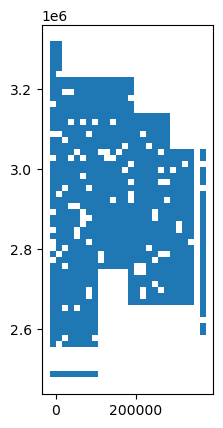

In [249]:
gpd.read_file(f'/projects/shared-buckets/montesano/DPS_tile_lists/SAR/{DPS_IDENTIFIER}/S1_subtile_tindex_master.gpkg').plot()

## Map the DPS'd subtiles

In [246]:
f'{DPS_IDENTIFIER}'

'EXPORT_GEE_v6/SAR_S1_2021'

/projects/code/icesat2_boreal/lib/ExtractUtils.py:618: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = geopandas.read_file(geopandas.datasets.get_path("naturalearth_lowres") )


(817, 6)


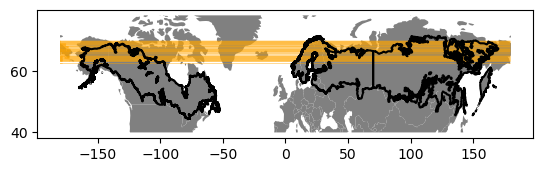

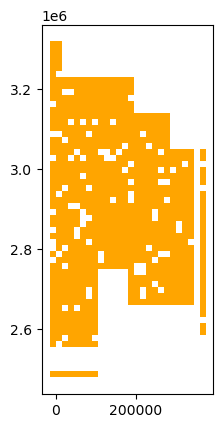

In [247]:
S1_subtiles_tindex_master = gpd.read_file(f'/projects/shared-buckets/montesano/DPS_tile_lists/SAR/{DPS_IDENTIFIER}/S1_subtile_tindex_master.gpkg')
ExtractUtils.show_tiles_map(S1_subtiles_tindex_master.to_crs(4326))
S1_subtiles_tindex_master.plot(color='orange')
print(S1_subtiles_tindex_master.shape)

if True:
    #m = S1_subtiles_tindex_master[~((S1_subtiles_tindex_master.tile_num == 9) | (S1_subtiles_tindex_master.tile_num == 10))].explore()
    m = S1_subtiles_tindex_master[(S1_subtiles_tindex_master.tile_num == 10)].explore()
    m=boreal_tiles_agg_new_updated_dateline.boundary.explore(m=m, color='green')
    m = boreal_tiles.boundary.explore(m=m, color='red')
m

In [477]:
# Identify rows with duplicate geometries
duplicate_rows = S1_subtiles_tindex_master[S1_subtiles_tindex_master.duplicated(subset='geometry', keep=False)]

## Get missing subtiles

In [293]:
S1_gee_subtiles_gdf = gpd.read_file(f'/projects/my-public-bucket/DPS_tile_lists/SAR/{DPS_IDENTIFIER}/S1_gee_subtiles.gpkg')
S1_2019_gee_subtiles_gdf = gpd.read_file(f'/projects/my-public-bucket/DPS_tile_lists/SAR/EXPORT_GEE_v6/SAR_S1_2019/S1_gee_subtiles.gpkg')

In [295]:
S1_gee_subtiles_gdf[S1_gee_subtiles_gdf.tile_num == 10].explore(color='blue')
#S1_2019_gee_subtiles_gdf[S1_2019_gee_subtiles_gdf.tile_num == 10].explore(m=m, color='red')

In [494]:
S1_gee_subtiles_gdf['tile_num'] = S1_gee_subtiles_gdf['AGG_TILE_NUM']

In [479]:
#S1_gee_subtiles_gdf.to_crs(4326).cx[-5:5,45:90].explore()

In [296]:
S1_subtiles_tindex_master.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 817 entries, 0 to 816
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype   
---  ------        --------------  -----   
 0   AGG_TILE_NUM  817 non-null    int64   
 1   subtile_num   817 non-null    int64   
 2   tile_num      817 non-null    int64   
 3   s3_path       817 non-null    object  
 4   local_path    817 non-null    object  
 5   geometry      817 non-null    geometry
dtypes: geometry(1), int64(3), object(2)
memory usage: 38.4+ KB


In [481]:
#S1_subtiles_tindex_master[S1_subtiles_tindex_master.tile_num == 67].explore()

In [299]:
JOIN_COL_LIST = ['subtile_num','tile_num']

In [483]:
if False:
    S1_none_geom_tiles = pd.read_csv(f'/projects/my-public-bucket/DPS_tile_lists/SAR/{DPS_IDENTIFIER}/S1_subtile_tindex_master_none_geom.csv')

    # Merge GeoDataFrame and DataFrame based on 'subtile_num' and 'tile_num'
    merged_df = S1_gee_subtiles_gdf.merge(S1_none_geom_tiles[JOIN_COL_LIST], on=JOIN_COL_LIST)

    # Select rows in the GeoDataFrame where the 'subtile_num' and 'tile_num' match
    selected_rows = S1_gee_subtiles_gdf[S1_gee_subtiles_gdf[['subtile_num', 'tile_num']].isin(merged_df[JOIN_COL_LIST]).all(axis=1)]

    S1_gee_subtiles_gdf[(S1_gee_subtiles_gdf.tile_num == 51) & (S1_gee_subtiles_gdf.subtile_num > 689)]

In [297]:
# Find the difference between the DPS'd subtiles and the expected
cols_list = ['subtile_num','tile_num','geometry']

In [298]:
# Get difference df
def GET_DIFF_GDF(df1, df2, COLS_LIST):
    df = (
        df1.merge(df2, 
                  on=COLS_LIST, 
                  how='outer', 
                  indicator=True)
        .query('_merge != "both"')
        .drop(columns='_merge')
        ).set_geometry('geometry_x')
    return df

In [303]:
difference_df = GET_DIFF_GDF(S1_gee_subtiles_gdf[S1_gee_subtiles_gdf.AGG_TILE_NUM == 10][cols_list], S1_subtiles_tindex_master[cols_list], JOIN_COL_LIST)

In [304]:
# Intersect these with the boreal tiles (exludes edge subtiles that we wont need?)
difference_df_intersect = difference_df[difference_df.intersects(boreal_tiles.to_crs(difference_df.crs).unary_union)]

In [309]:
difference_df.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 147 entries, 8 to 953
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   subtile_num  147 non-null    int64   
 1   tile_num     147 non-null    int64   
 2   geometry_x   147 non-null    geometry
 3   geometry_y   0 non-null      geometry
dtypes: geometry(2), int64(2)
memory usage: 5.7 KB


In [306]:
difference_df_intersect.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 147 entries, 8 to 953
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   subtile_num  147 non-null    int64   
 1   tile_num     147 non-null    int64   
 2   geometry_x   147 non-null    geometry
 3   geometry_y   0 non-null      geometry
dtypes: geometry(2), int64(2)
memory usage: 5.7 KB


### Map subtiles still missing

In [499]:
if False:
    m = S1_subtiles_tindex_master[S1_subtiles_tindex_master.tile_num == 60].explore(color='blue') #[S1_subtiles_tindex_master.subtile_num ==0].explore()
    m = S1_gee_subtiles_gdf[S1_gee_subtiles_gdf.tile_num == 60].explore(m=m, color='green')

    difference_df = gpd.overlay(S1_gee_subtiles_gdf[S1_gee_subtiles_gdf.tile_num >= 0][cols_list], S1_subtiles_tindex_master[S1_subtiles_tindex_master.tile_num >= 0][cols_list], how='difference')
    difference_df.explore(m=m, color='black')

In [307]:
m = asset_gdf_clean.explore(color='blue')

m=boreal_tiles.explore(m=m, color='gray')
m=difference_df.explore(m=m, color='red')
m
# # Find most recently processed subtiles to know where you need to run build_stack again
# RECENT_LIST = sorted(S1_subtiles.s3_path.to_list())[-190:]
# S1_subtiles[S1_subtiles.s3_path.isin(RECENT_LIST)].explore(m=m, color='green')

In [290]:
import s3fs
s3 = s3fs.S3FileSystem(anon=True)

In [293]:
sorted(S1_subtiles_tindex_master.s3_path.to_list())[-190:]
fn = S1_subtiles_tindex_master[(S1_subtiles_tindex_master.subtile_num == 342) & 
                          (S1_subtiles_tindex_master.tile_num == 62)].s3_path.to_list()[0]
print(fn)
s3.download(fn, '/projects/my-public-bucket/local_output')

s3://maap-ops-workspace/montesano/dps_output/do_gee_download_by_subtile/EXPORT_GEE_v6/SAR_S1_2019/2024/01/16/09/41/20/789063/s1_vv_vh_gamma_2019_pwr_tile62-subtile000342/s1_vv_vh_gamma_2019_pwr_tile62-subtile000342.tif


[None]

<Axes: >

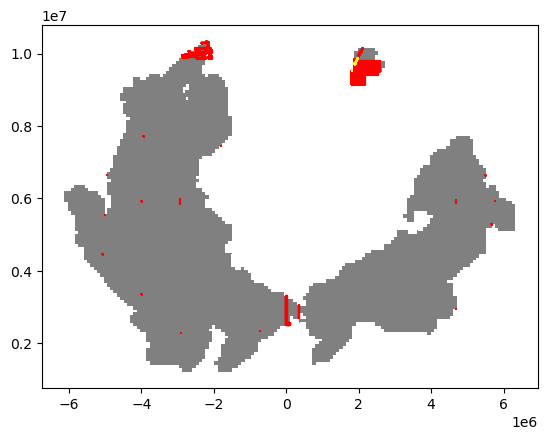

In [502]:
ax = S1_gee_subtiles_gdf.plot(color='gray')
ax = difference_df.boundary.plot(ax=ax, color='red')
difference_df_intersect[difference_df_intersect.tile_num == 52].boundary.plot(ax=ax, color='yellow')

In [458]:
if False:
    TEST_AGG_TILE = 59
    difference_df = GET_DIFF_GDF(S1_gee_subtiles_gdf[S1_gee_subtiles_gdf.tile_num == TEST_AGG_TILE][cols_list], S1_subtiles_tindex_master[S1_subtiles_tindex_master.tile_num == TEST_AGG_TILE][cols_list], JOIN_COL_LIST)
    m = asset_gdf_clean.explore(color='blue')
    difference_df.explore(m=m, color='black')

In [459]:
if False:
    # This gives the expected tiles that are not found in the resulting (DPS processed) subtiles
    difference_df = gpd.overlay(S1_gee_subtiles_gdf[cols_list], S1_subtiles_tindex_master[cols_list], how='difference')

    # Intersect these with the boreal tiles (exludes edge subtiles that we wont need?)
    difference_df_intersect = difference_df[difference_df.intersects(boreal_tiles.to_crs(difference_df.crs).unary_union)]

#### Explore subtiles that failed

In [534]:
agg_tiles_index = gpd.read_file('/projects/my-public-bucket/databank/boreal_tiles_v004_agg12/boreal_tiles_v004_agg12.gpkg')
agg_tiles_index['tile_num'] = agg_tiles_index['agg_tile_num']

# Convert Polygon GeoDataFrame to LineString GeoDataFrame
line_gdf = gpd.GeoDataFrame(geometry=agg_tiles_index['geometry'].boundary).reset_index()
# line_gdf[line_gdf['index'] == 48].explore()

# Perform a spatial join to identify polygons that intersect lines
SAR_agg_tile_checks = gpd.sjoin(boreal_tiles, line_gdf, how='inner', op='intersects')

/projects/env/above/lib/python3.9/site-packages/IPython/core/interactiveshell.py:3488: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):


In [566]:
BAD_TILES = [9,67,68] # dateline and meridian subtiles have issues
S1_SUBTILES_REDO = difference_df_intersect[~difference_df_intersect.tile_num.isin(BAD_TILES)]#[~((difference_df_intersect.tile_num == 10) & (difference_df_intersect.subtile_num < 112))]
print(S1_SUBTILES_REDO.shape)
m = SAR_agg_tile_checks.explore(color='yellow')
S1_SUBTILES_REDO.explore(m=m, color='red')

(520, 4)


In [567]:
S1_SUBTILES_REDO.head()

,subtile_num,tile_num,geometry_x,geometry_y
6896,494,5,"POLYGON ((-727394.741 2313304.000, -712394.741...",None
10934,0,7,"POLYGON ((-2923815.127 2281904.756, -2908815.1...",None
37229,16,10,"POLYGON ((-15015.094 2598304.000, -15.094 2598...",None
37230,16,10,"POLYGON ((-15015.094 2598304.000, -15.094 2598...",None
37231,16,10,"POLYGON ((-15015.094 2598304.000, -15.094 2598...",None


In [369]:
# S1_SUBTILES_REDO['geometry'] = S1_SUBTILES_REDO['geometry_x']
# tmp = S1_SUBTILES_REDO[['subtile_num','tile_num','geometry']]
# tmp.to_file(f'/projects/my-public-bucket/DPS_tile_lists/SAR/{DPS_IDENTIFIER}/S1_subtile_tindex_master_REDO.gpkg', driver='GPKG')

In [630]:
S1_SUBTILES_REDO = S1_gee_subtiles[ (S1_gee_subtiles.AGG_TILE_NUM == 10) | (S1_gee_subtiles.AGG_TILE_NUM == 9)]
S1_SUBTILES_REDO['tile_num'] = S1_SUBTILES_REDO['AGG_TILE_NUM']
S1_SUBTILES_REDO.boundary.explore()

/projects/env/above/lib/python3.9/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


### Make a new params list for DPS

In [631]:
LIST_in_param_dict = []

for index, row in S1_SUBTILES_REDO.iterrows():
    in_param_dict = {
                                'creds_fn' : CREDS_FN,
                                 'subtile_loc': row['subtile_num'],
                                 'id_num': row['tile_num'],
                                 'id_col': TILE_FIELD_NAME,
                                 'tile_size_m': TILE_SIZE_M,
                                 'input_nodata_value': -9999,
                                 'asset_path': ASSET_PATH,
                                 'cleaner_gdf_fn': CLEANER_GDF_FN
                }

    LIST_in_param_dict.append(in_param_dict)
            
print(f'# DPS jobs to launch: {len(LIST_in_param_dict)}')
print('fewer than these will succeed, b/c subtiles at dateline should fail.')

# DPS jobs to launch: 10458
fewer than these will succeed, b/c subtiles at dateline should fail.


In [632]:
LIST_in_param_dict[0]

{'creds_fn': 's3://maap-ops-workspace/montesano/credentials',
 'subtile_loc': 0,
 'id_num': 9,
 'id_col': 'AGG_TILE_NUM',
 'tile_size_m': 500,
 'input_nodata_value': -9999,
 'asset_path': 'projects/foreststructure/Circumboreal/S1_triseason_albers_2020',
 'cleaner_gdf_fn': 'https://maap-ops-workspace.s3.amazonaws.com/shared/montesano/databank/boreal_tiles_v004.gpkg'}